This notebook demonstrates how to train a YOLOv8 model on a COCO2017 dataset for object detection tasks. COCO is a large-scale object detection, segmentation, and captioning dataset. COCO has several features:

- Object segmentation
- Recognition in context
- Superpixel stuff segmentation
- 330K images (>200K labeled)
- 1.5 million object instances
- 80 object categories
- 91 stuff categories
- 5 captions per image
- 250,000 people with keypoints

In this project, we will:

- Prepare the dataset
- Train the YOLOv8 model
- Evaluate the model's performance
- Visualize the results

## 1. Installing YOLO Dependencies

This section ensures the necessary YOLO framework is installed by using the ultralytics library, which provides tools for training, validation, and inference with YOLOv8.

In [1]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.6/914.6 kB 20.2 MB/s eta 0:00:00


## 2. Importing Libraries

This section imports essential Python libraries:

- torch: For deep learning operations and model handling.
- os: To manage and interact with the file system.
- shutil: For high-level file operations like copying and moving files.
- yaml: To read and parse configuration files.
- IPython.display: For displaying images and clearing output in Jupyter notebooks.

In [2]:
import torch
import os
import shutil
import yaml
from IPython.display import Image, clear_output 

## 3. Preparing Data for Training

This section prepares the dataset for YOLO training by verifying paths and converting COCO annotations to the YOLO format.

In [3]:
import os 

os.listdir('/kaggle/input/')

['coco2017']

### 3.1 Verify Dataset Structure

Checks the dataset's structure and confirms the availability of annotations and images.
Key Code Actions:
- Lists the files in the annotations directory.
- Counts and displays the number of training, validation, and test images.

In [4]:
import os 

os.listdir('/kaggle/input/')

base_path = "/kaggle/input/coco2017"
print("Annotations:", os.listdir(os.path.join(base_path, "annotations")))
print("Training images:", len(os.listdir(os.path.join(base_path, "train2017"))))
print("Validation images:", len(os.listdir(os.path.join(base_path, "val2017"))))
print("Test images:", len(os.listdir(os.path.join(base_path, "test2017"))))

Annotations: ['person_keypoints_train2017.json', 'instances_val2017.json', 'instances_train2017.json', 'person_keypoints_val2017.json', 'captions_train2017.json', 'captions_val2017.json']
Training images: 118287
Validation images: 5000
Test images: 40670


### 3.2 Convert COCO annotation to YOLO format

Converts bounding box annotations from the COCO format (used by the dataset) to the YOLO format.
**Libraries Used**:
- pycocotools: To parse COCO annotation files.
- os: For file operations and directory management.

**Key Code Actions**:
- Bounding Box Conversion: Converts COCO bounding boxes (x, y, width, height) to YOLO's format (center_x, center_y, width, height) relative to the image size.
- Annotation Processing: Iterates through each image in the COCO dataset, extracts annotations, and saves them in .txt files suitable for YOLO.
Handling Edge Cases: Warns about missing files or duplicate labels to ensure data consistency.

In [5]:
!pip install pycocotools


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.8/427.8 kB 11.0 MB/s eta 0:00:00


In [6]:
import json
from pycocotools.coco import COCO
import os

train_annotation_path = "/kaggle/input/coco2017/annotations/instances_train2017.json"
val_annotation_path = "/kaggle/input/coco2017/annotations/instances_val2017.json"
train_images_dir = "/kaggle/input/coco2017/train2017"
val_images_dir = "/kaggle/input/coco2017/val2017"
output_labels_train_dir = "/kaggle/working/dataset/labels/train"
output_labels_val_dir = "/kaggle/working/dataset/labels/val"

os.makedirs(output_labels_train_dir, exist_ok=True)
os.makedirs(output_labels_val_dir, exist_ok=True)

nc = 80
def convert_bbox_to_yolo(image_width, image_height, bbox):
    x, y, w, h = bbox
    x_center = (x + w / 2) / image_width
    y_center = (y + h / 2) / image_height
    w = w / image_width
    h = h / image_height
    return x_center, y_center, w, h

def process_coco_annotations(annotation_path, output_labels_dir, images_dir):
   
    coco = COCO(annotation_path)

    for img_id in coco.getImgIds():
        img_info = coco.loadImgs([img_id])[0]
        img_filename = img_info['file_name']
        img_path = os.path.join(images_dir, img_filename)
        
        if not os.path.exists(img_path):
            print(f"Warning: {img_filename} not found in {images_dir}")
            continue

        img_width, img_height = img_info['width'], img_info['height']
        
        annotations = coco.loadAnns(coco.getAnnIds(imgIds=[img_id]))
        
        label_file_path = os.path.join(output_labels_dir, f"{img_filename.split('.')[0]}.txt")
        with open(label_file_path, 'w') as label_file:
            seen_labels = set()
            for ann in annotations:
                if 'bbox' in ann:
                    bbox = convert_bbox_to_yolo(img_width, img_height, ann['bbox'])
                    class_id = ann['category_id'] - 1
                    
                    if class_id >= nc:
                        # print(f"Warning: Class ID {class_id} in {img_filename} exceeds nc={nc}. Skipping this annotation.")
                        continue
                    label_str = f"{class_id} {' '.join(map(str, bbox))}\n"
                    if label_str not in seen_labels:
                        label_file.write(label_str)
                        seen_labels.add(label_str)
                    else:
                        print(f"Warning: Duplicate label found in {img_filename}. Skipping this annotation.")

# Process both training and validation annotations
process_coco_annotations(train_annotation_path, output_labels_train_dir, train_images_dir)
process_coco_annotations(val_annotation_path, output_labels_val_dir, val_images_dir)

loading annotations into memory...
Done (t=21.33s)
creating index...
index created!
loading annotations into memory...
Done (t=0.70s)
creating index...
index created!


## 4. Creating Symbolic Links for Training and Validation Images

This section creates symbolic links for the training and validation images to organize the dataset in a structure suitable for YOLOv8.

**Key Code Actions**:
- Creates directories for training and validation images.
- Links images from the COCO dataset to these directories for easier access during training.

In [7]:
import os

train_images_dir = "/kaggle/input/coco2017/train2017"
val_images_dir = "/kaggle/input/coco2017/val2017"
output_train_images_dir = "/kaggle/working/dataset/images/train"
output_val_images_dir = "/kaggle/working/dataset/images/val"

os.makedirs(output_train_images_dir, exist_ok=True)
os.makedirs(output_val_images_dir, exist_ok=True)

for img_filename in os.listdir(train_images_dir):
    img_path = os.path.join(train_images_dir, img_filename)
    symlink_path = os.path.join(output_train_images_dir, img_filename)
    if not os.path.exists(symlink_path):
        os.symlink(img_path, symlink_path)

for img_filename in os.listdir(val_images_dir):
    img_path = os.path.join(val_images_dir, img_filename)
    symlink_path = os.path.join(output_val_images_dir, img_filename)
    if not os.path.exists(symlink_path):
        os.symlink(img_path, symlink_path)


## 5. Listing Classes in COCO Dataset
This section lists all the classes in the COCO dataset to confirm the categories available for object detection.

**Key Code Actions**:
- Loads the COCO annotation file.
- Extracts and prints the names of all the classes.

In [8]:
import json
from pycocotools.coco import COCO
annotation_path = "/kaggle/input/coco2017/annotations/instances_train2017.json"
coco = COCO(annotation_path)

categories = coco.loadCats(coco.getCatIds())
class_names = [category['name'] for category in categories]
print("Classes in COCO dataset:", class_names)


loading annotations into memory...
Done (t=16.15s)
creating index...
index created!
Classes in COCO dataset: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']


## 6. Creating data.yaml for YOLOv8
This section generates the data.yaml file required by YOLOv8 to define dataset paths, the number of classes, and their names.

**Key Code Actions**:
- Specifies paths to training and validation images.
- Includes all 80 COCO dataset classes with their corresponding IDs.
- Saves the configuration to data.yaml.

In [9]:
data_yaml = """
train: /kaggle/working/dataset/images/train
val: /kaggle/working/dataset/images/val
nc: 80  # Number of classes, which should be 80 for COCO dataset
names:
  0: 'person'
  1: 'bicycle'
  2: 'car'
  3: 'motorcycle'
  4: 'airplane'
  5: 'bus'
  6: 'train'
  7: 'truck'
  8: 'boat'
  9: 'traffic light'
  10: 'fire hydrant'
  11: 'N/A'
  12: 'stop sign'
  13: 'parking meter'
  14: 'bench'
  15: 'bird'
  16: 'cat'
  17: 'dog'
  18: 'horse'
  19: 'sheep'
  20: 'cow'
  21: 'elephant'
  22: 'bear'
  23: 'zebra'
  24: 'giraffe'
  25: 'N/A'
  26: 'backpack'
  27: 'umbrella'
  28: 'handbag'
  29: 'tie'
  30: 'suitcase'
  31: 'frisbee'
  32: 'skis'
  33: 'snowboard'
  34: 'sports ball'
  35: 'kite'
  36: 'baseball bat'
  37: 'baseball glove'
  38: 'skateboard'
  39: 'surfboard'
  40: 'tennis racket'
  41: 'bottle'
  42: 'wine glass'
  43: 'cup'
  44: 'fork'
  45: 'knife'
  46: 'spoon'
  47: 'bowl'
  48: 'banana'
  49: 'apple'
  50: 'sandwich'
  51: 'orange'
  52: 'broccoli'
  53: 'carrot'
  54: 'hot dog'
  55: 'pizza'
  56: 'donut'
  57: 'cake'
  58: 'chair'
  59: 'couch'
  60: 'potted plant'
  61: 'bed'
  62: 'dining table'
  63: 'toilet'
  64: 'tv'
  65: 'laptop'
  66: 'mouse'
  67: 'remote'
  68: 'keyboard'
  69: 'cell phone'
  70: 'microwave'
  71: 'oven'
  72: 'toaster'
  73: 'sink'
  74: 'refrigerator'
  75: 'book'
  76: 'clock'
  77: 'vase'
  78: 'scissors'
  79: 'teddy bear'
"""
with open('/kaggle/working/dataset/data.yaml', 'w') as f:
    f.write(data_yaml)


## 7. Model Training
This section trains the YOLOv8 model on the prepared dataset.

**Model Used**: yolov8s.pt (YOLOv8 small pre-trained weights).

**Dataset Configuration**: Uses the data.yaml file to specify paths, number of classes, and class names.

**Training Parameters**:
- **Epochs**: 3 (number of times the model sees the entire dataset).
- **Batch Size**: 16 (number of images processed together during training).
- **Image Size:** 640x640 (resized input image dimensions).
  
The model learns to detect objects in the images based on the COCO dataset annotations. Training progress and results are saved in the output directory.

In [10]:
from ultralytics import YOLO
model = YOLO('yolov8s.pt')
model.train(data='/kaggle/working/dataset/data.yaml', epochs=5, batch=32, imgsz=640)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:02<00:00, 9.56MB/s]


Ultralytics 8.3.73 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/dataset/data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True

100%|██████████| 755k/755k [00:00<00:00, 3.53MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

100%|██████████| 5.35M/5.35M [00:00<00:00, 107MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/labels/train... 118287 images, 4296 backgrounds, 0 corrupt: 100%|██████████| 118287/118287 [04:53<00:00, 402.67it/s]


train: New cache created: /kaggle/working/dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.3 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/labels/val... 5000 images, 198 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:16<00:00, 298.50it/s]


val: New cache created: /kaggle/working/dataset/labels/val.cache


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      8.69G       1.03       1.36      1.142        188        640: 100%|██████████| 3697/3697 [34:51<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:41<00:00,  1.90it/s]


                   all       5000      34430       0.66      0.528      0.571      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      8.58G      1.036      1.094      1.151        136        640: 100%|██████████| 3697/3697 [34:45<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:39<00:00,  1.98it/s]


                   all       5000      34430      0.663      0.536      0.583      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      8.58G      1.041        1.1      1.155        211        640: 100%|██████████| 3697/3697 [34:27<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:39<00:00,  2.03it/s]


                   all       5000      34430      0.657      0.543      0.588      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.63G      1.032       1.08       1.15        174        640: 100%|██████████| 3697/3697 [34:26<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:40<00:00,  1.97it/s]


                   all       5000      34430      0.665      0.551      0.597      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      8.78G      1.013      1.034      1.137        116        640: 100%|██████████| 3697/3697 [34:24<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:39<00:00,  2.03it/s]


                   all       5000      34430      0.677      0.554      0.603      0.436

5 epochs completed in 2.944 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.73 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 79/79 [00:43<00:00,  1.81it/s]


                   all       5000      34430      0.676      0.555      0.603      0.436
                person       2693      11004      0.797      0.698      0.783      0.558
               bicycle        149        316      0.706      0.421      0.537      0.317
                   car        535       1932       0.71      0.577      0.646      0.433
            motorcycle        159        371      0.771       0.62      0.706      0.456
              airplane         97        143      0.812      0.832      0.889      0.703
                   bus        189        285      0.815      0.726      0.804      0.678
                 train        157        190      0.854      0.805      0.876      0.681
                 truck        250        415      0.634      0.455      0.538      0.381
                  boat        121        430      0.636       0.41      0.464      0.249
         traffic light        191        637      0.695      0.419      0.487       0.26
          fire hydran

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 66, 69, 71, 72, 73, 74, 75, 76, 77, 78, 79])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x785e293fd240>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,

## 8. Model Validation
This section evaluates the trained YOLOv8 model on the validation dataset to measure its performance.

**Dataset**: Validation data is defined in the data.yaml file.

**Output**:
- Calculates key metrics such as mAP (mean Average Precision), precision, and recall.
- Provides a detailed summary of the model's performance on the validation set.
- The validation metrics help assess how well the model generalizes to unseen data. The results are displayed for review.

In [11]:
metrics = model.val(data='/kaggle/working/dataset/data.yaml')
print("Validation Results:")
print(metrics)

Ultralytics 8.3.73 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs


val: Scanning /kaggle/working/dataset/labels/val.cache... 5000 images, 198 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 157/157 [00:45<00:00,  3.42it/s]


                   all       5000      34430      0.677      0.554      0.603      0.436
                person       2693      11004      0.798      0.696      0.784      0.558
               bicycle        149        316      0.707      0.419      0.538      0.316
                   car        535       1932      0.713      0.576      0.647      0.432
            motorcycle        159        371      0.774       0.62      0.705      0.456
              airplane         97        143      0.813      0.832       0.89      0.704
                   bus        189        285      0.819      0.726      0.804      0.678
                 train        157        190      0.855      0.804      0.876      0.682
                 truck        250        415      0.636      0.455      0.539      0.382
                  boat        121        430      0.633      0.405      0.464      0.251
         traffic light        191        637      0.693      0.415      0.484      0.259
          fire hydran

## 9. Testing YOLOv8 Model on Test Images
This section tests the YOLOv8 model on unseen images from the test dataset to evaluate its real-world performance.

- **Test Data Source**: First 30 images from the COCO 2017 test dataset.
- **Prediction Results**: The model's predictions are saved in the runs/detect/train5 directory.
- **Purpose**: To visualize how the trained model performs on untrained data.


In [12]:
test_images_path = '/kaggle/input/coco2017/test2017'
test_images = os.listdir(test_images_path)[:30]
test_images_full_paths = [os.path.join(test_images_path, img) for img in test_images]
results = model.predict(source=test_images_full_paths, save=True, save_txt=False)

from pathlib import Path

output_dir = Path("/kaggle/working/detect")  
output_dir.mkdir(parents=True, exist_ok=True)
print(f"Results saved in: {output_dir}")




0: 640x640 1 bench, 4.9ms
1: 640x640 2 persons, 4 cars, 1 motorcycle, 1 truck, 1 traffic light, 4.9ms
2: 640x640 1 bowl, 2 bananas, 1 chair, 1 mouse, 4.9ms
3: 640x640 2 persons, 4.9ms
4: 640x640 2 persons, 1 cake, 1 bed, 4.9ms
5: 640x640 3 persons, 1 airplane, 4.9ms
6: 640x640 3 persons, 2 clocks, 4.9ms
7: 640x640 4 zebras, 4.9ms
8: 640x640 3 cars, 1 motorcycle, 3 beds, 4.9ms
9: 640x640 4 traffic lights, 4.9ms
10: 640x640 5 persons, 1 skateboard, 1 surfboard, 4.9ms
11: 640x640 2 persons, 1 sports ball, 4.9ms
12: 640x640 17 persons, 1 umbrella, 5 baseball gloves, 1 cup, 4.9ms
13: 640x640 2 persons, 3 sandwichs, 2 chairs, 1 bed, 1 mouse, 4.9ms
14: 640x640 4 persons, 1 bicycle, 2 cars, 2 stop signs, 4.9ms
15: 640x640 17 cups, 1 spoon, 4.9ms
16: 640x640 1 sandwich, 2 scissorss, 4.9ms
17: 640x640 1 stop sign, 4.9ms
18: 640x640 1 umbrella, 4.9ms
19: 640x640 2 airplanes, 4.9ms
20: 640x640 1 tv, 1 clock, 4.9ms
21: 640x640 6 persons, 2 trains, 1 suitcase, 4.9ms
22: 640x640 3 beds, 3 toilets, 1

In [13]:
model.export(format='torchscript', save_dir='/kaggle/working/saved_models')

Ultralytics 8.3.73 🚀 Python-3.10.14 torch-2.4.0 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (21.5 MB)

TorchScript: starting export with torch 2.4.0...
TorchScript: export success ✅ 3.9s, saved as 'runs/detect/train/weights/best.torchscript' (43.0 MB)

Export complete (6.1s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.torchscript imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.torchscript imgsz=640 data=/kaggle/working/dataset/data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best.torchscript'

## 10. Visualizing Training Results
This section displays the key visual metrics generated during training to analyze model performance.

**Visualizations**:
- **F1 curve**: Balances precision and recall.
- **P curve**: Precision curve.
- **R curve**: Recall curve.
- **Confusion matrix**: True positives, false positives, etc.
- **Labels**: Distribution of labels in the dataset.
- **Results**: Overall performance metrics summary.

The graphs provide insight into the training process and help diagnose potential issues.

Displaying: F1_curve.png
Displaying: P_curve.png
Displaying: R_curve.png
Displaying: confusion_matrix.png
Displaying: labels.jpg
Displaying: results.png


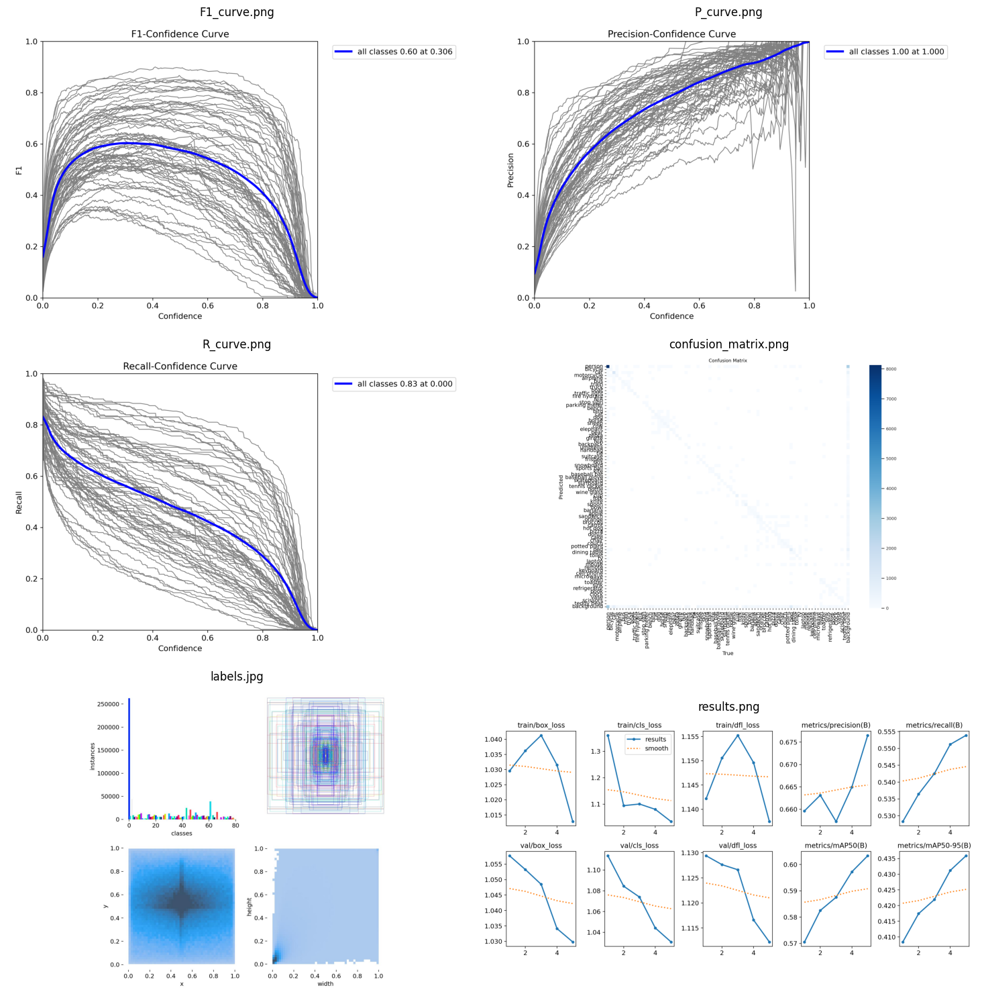

In [14]:
import os
from IPython.display import Image, display
import matplotlib.pyplot as plt

train_dir = "/kaggle/working/runs/detect/train" 

train_images = [
    "F1_curve.png",
    "P_curve.png",
    "R_curve.png",
    "confusion_matrix.png",
    "labels.jpg",
    "results.png",
]

num_images = len(train_images)
cols = 2 
rows = (num_images + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
axes = axes.flatten()  

for i, img_name in enumerate(train_images):
    img_path = os.path.join(train_dir, img_name)
    if os.path.exists(img_path):
        print(f"Displaying: {img_name}")
        img = plt.imread(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')  # Hide the axes
        axes[i].set_title(img_name)
    else:
        print(f"File not found: {img_name}")
        axes[i].axis('off')  
for j in range(i + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

## 11. Visualizing Validation Results
Displays validation-specific metrics to assess how well the model performs on unseen data during training.

- **Visualizations**:
  - F1, P, R curves, and confusion matrix: Evaluate precision, recall, and overall accuracy.
  - Batch predictions: Examples of the model's predictions on validation batches.

These results provide a deeper understanding of the model's generalization capability.

Displaying: F1_curve.png


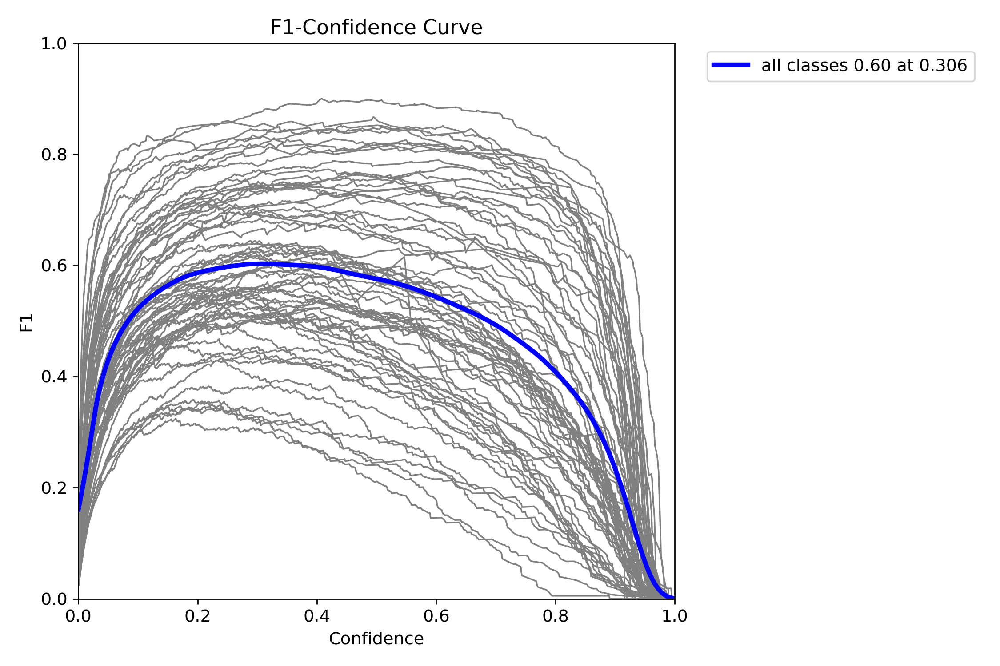

Displaying: P_curve.png


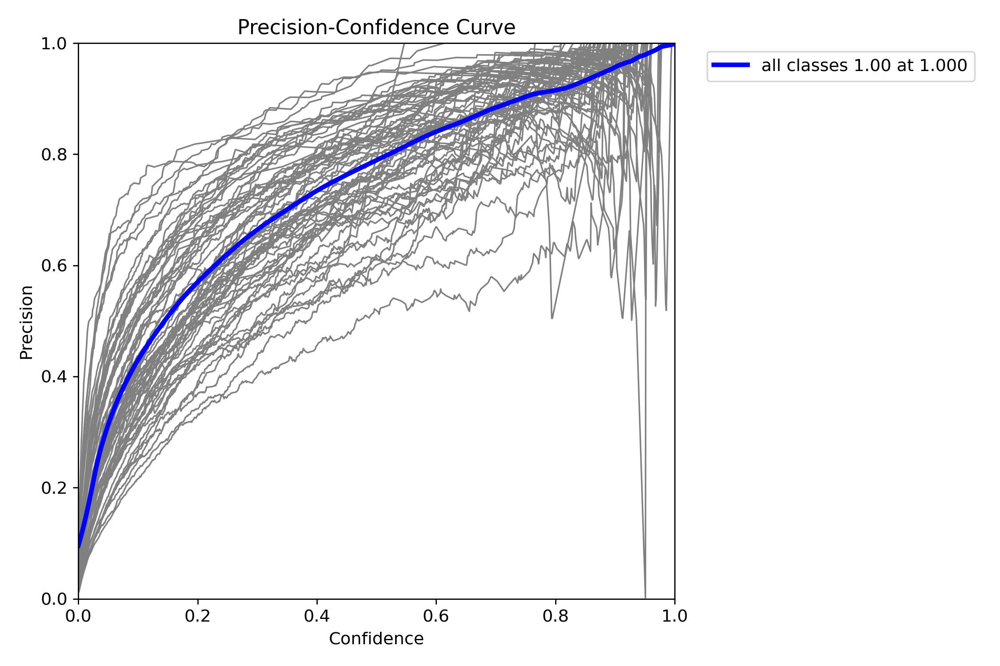

Displaying: R_curve.png


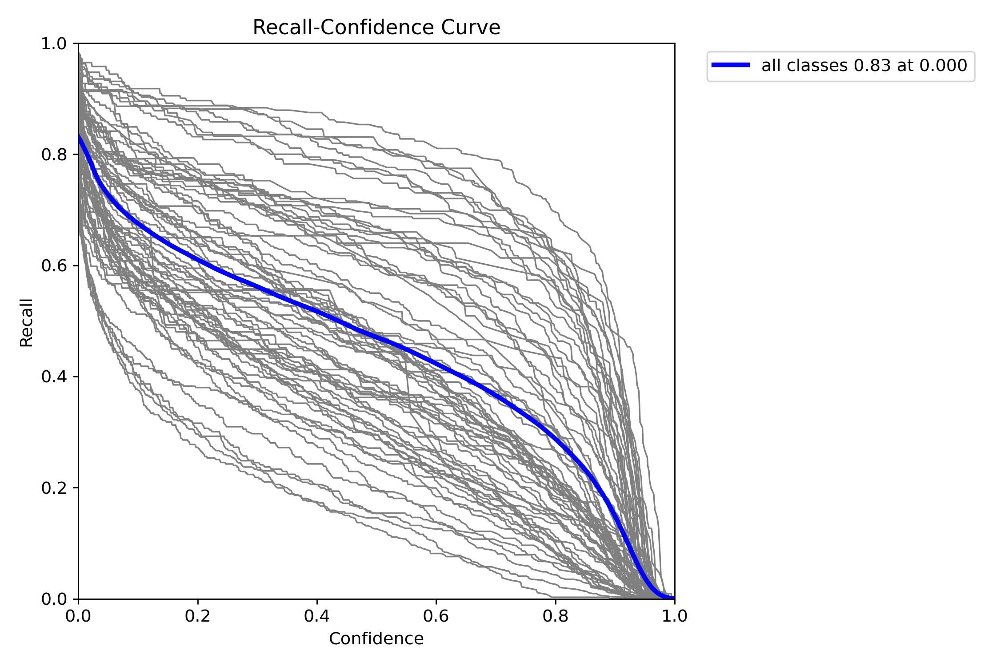

Displaying: confusion_matrix.png


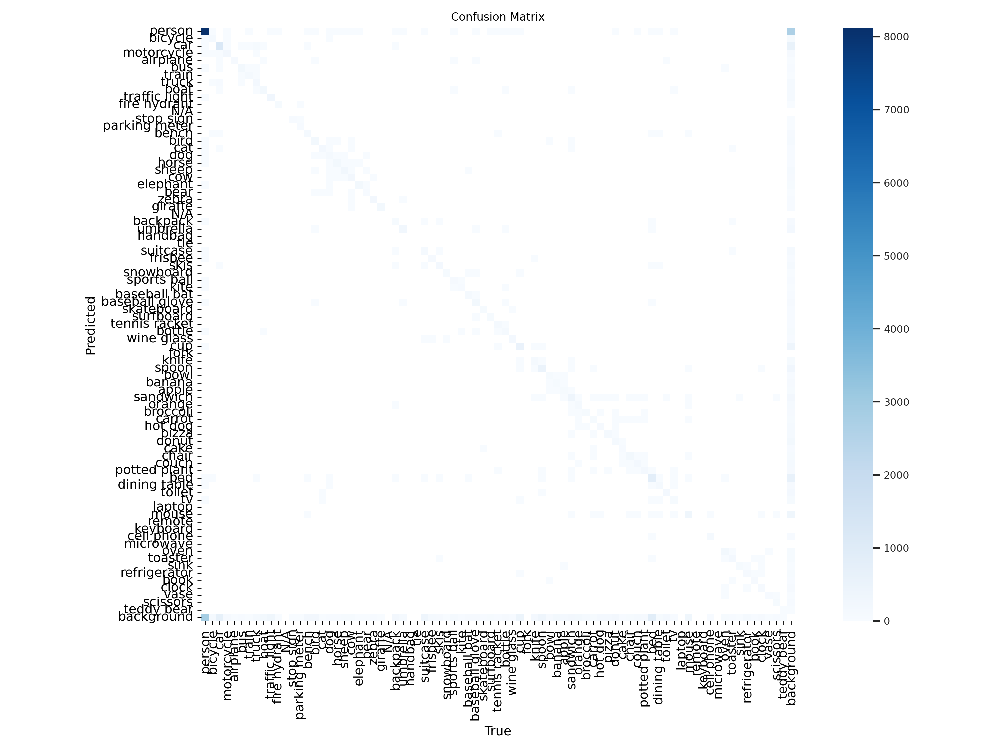

Displaying: val_batch0_pred.jpg


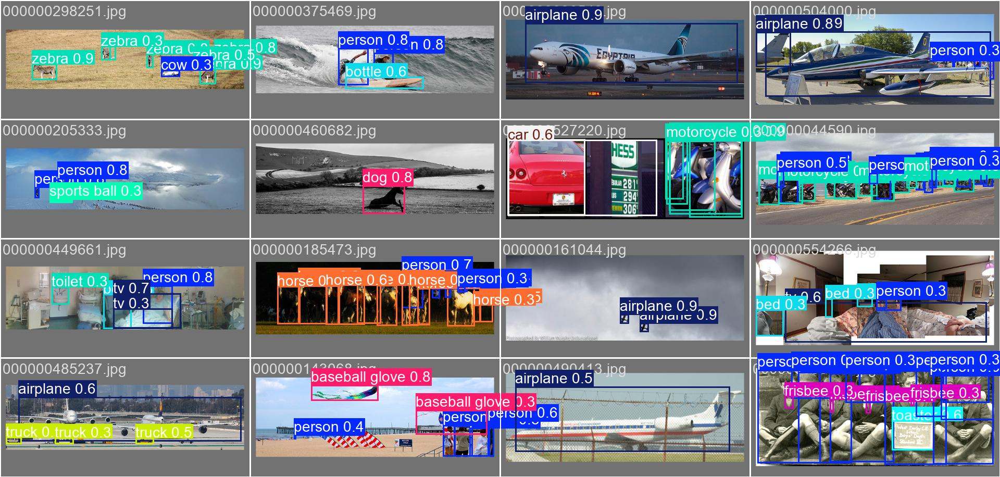

Displaying: val_batch1_pred.jpg


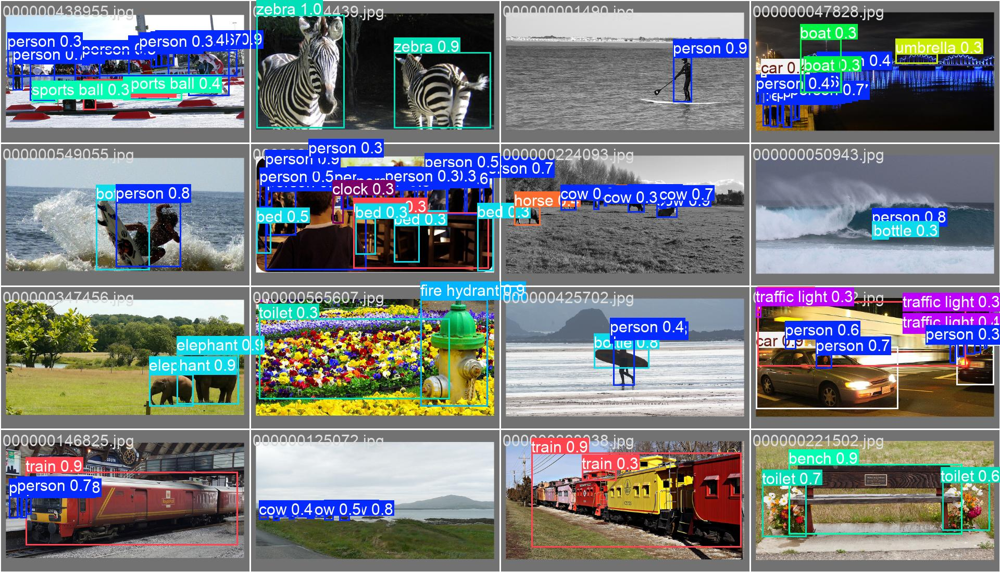

In [15]:

val_dir = "/kaggle/working/runs/detect/train2"  

val_images = [
    "F1_curve.png",
    "P_curve.png",
    "R_curve.png",
    "confusion_matrix.png",
    "val_batch0_pred.jpg",
    "val_batch1_pred.jpg",
]

for img_name in val_images:
    img_path = os.path.join(val_dir, img_name)
    if os.path.exists(img_path):
        print(f"Displaying: {img_name}")
        display(Image(filename=img_path))
    else:
        print(f"File not found: {img_name}")



## 12. Visualizing Predicted Images
Shows the model's predictions on test images.

- **Directory**: Predictions are saved in runs/detect/train5.
- **Visualization Purpose**:
  - To visually verify the quality of predictions.
  - Identify false positives, false negatives, or missed detections.

Displaying: 000000392696.jpg


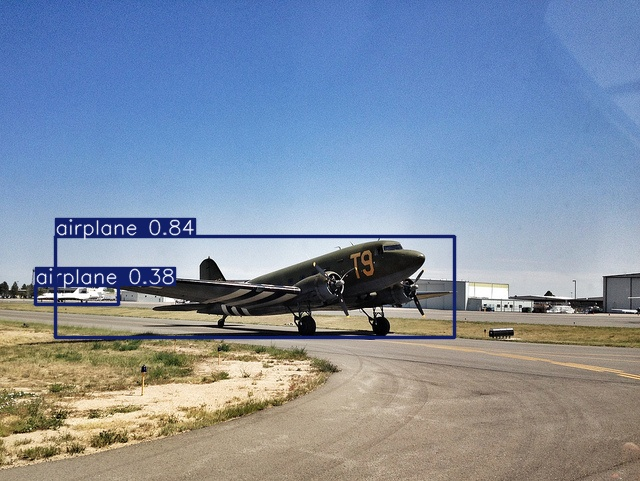

Displaying: 000000361311.jpg


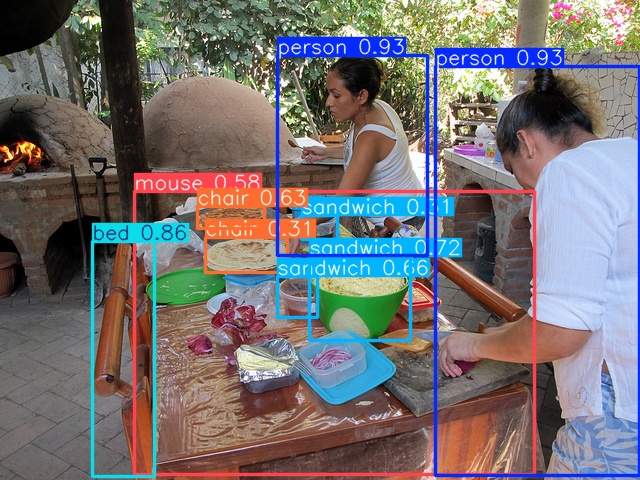

Displaying: 000000221457.jpg


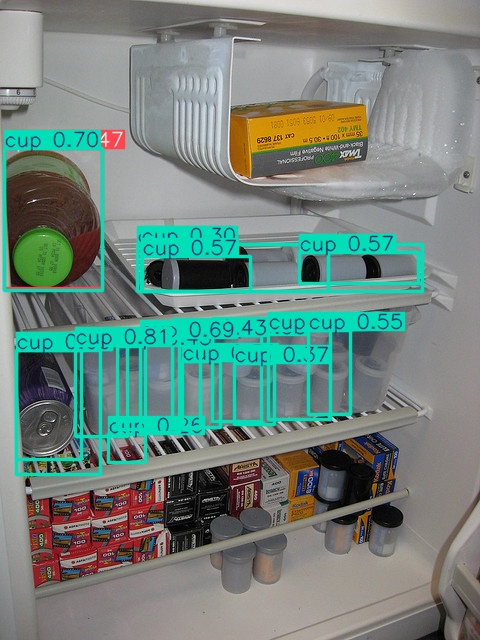

Displaying: 000000210548.jpg


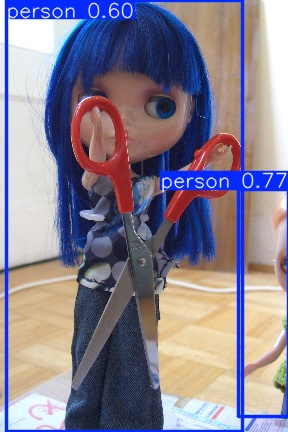

Displaying: 000000224870.jpg


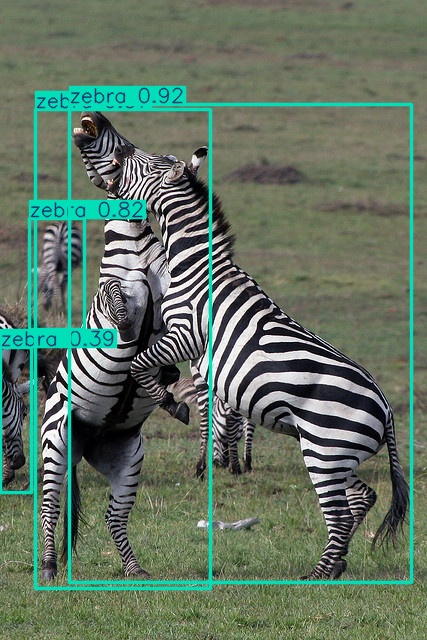

Displaying: 000000186607.jpg


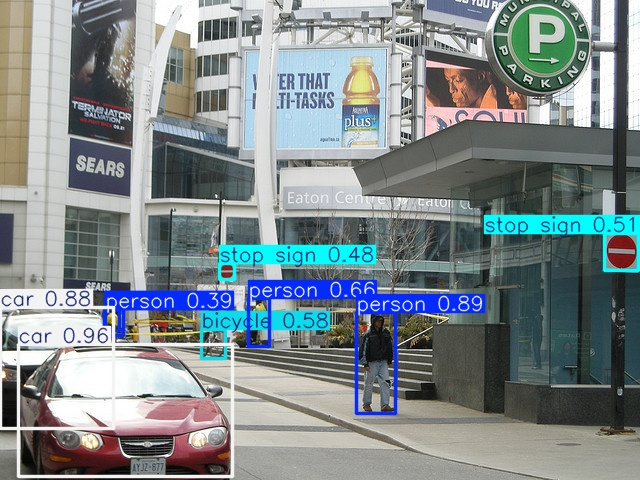

Displaying: 000000034843.jpg


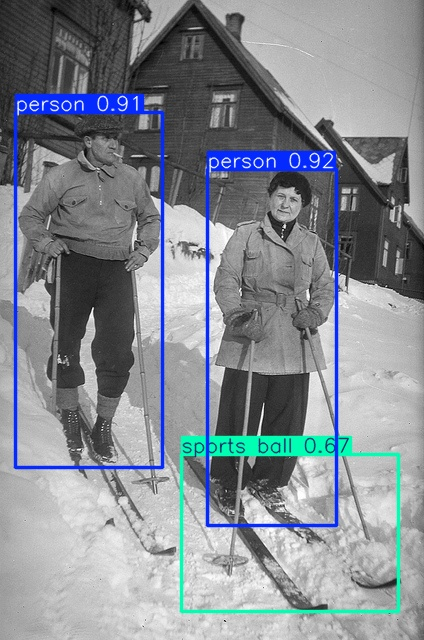

Displaying: 000000575054.jpg


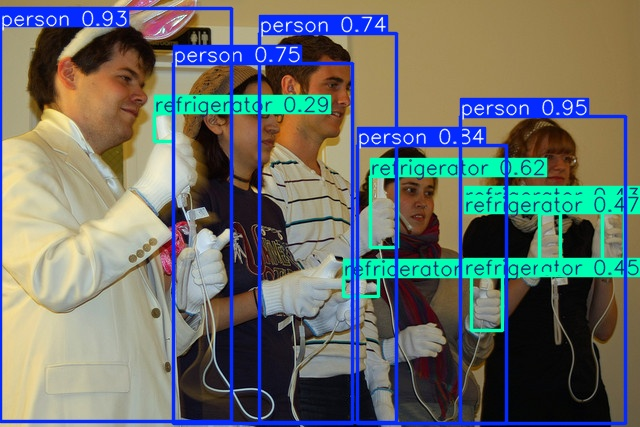

Displaying: 000000076582.jpg


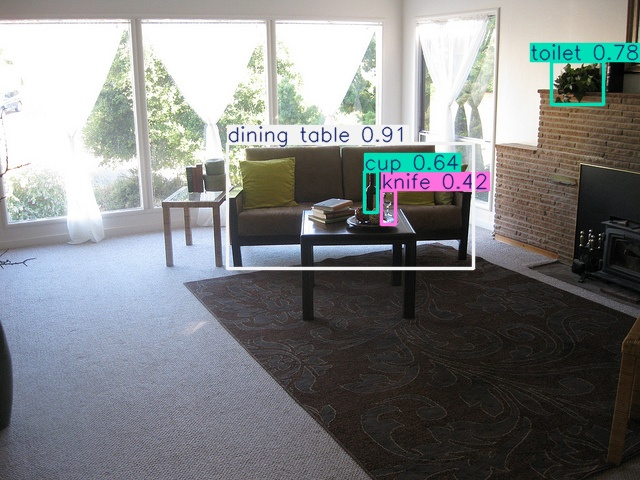

Displaying: 000000542999.jpg


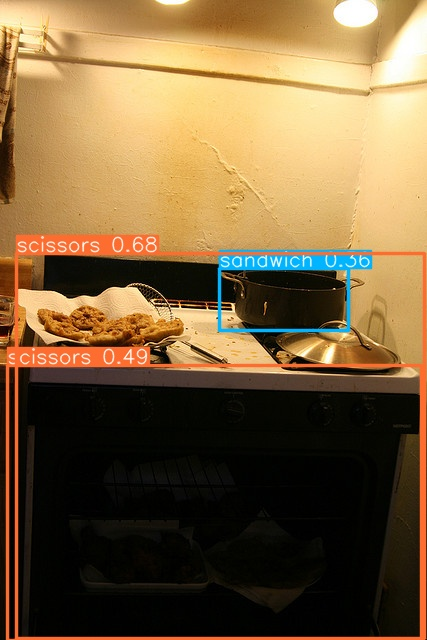

Displaying: 000000393848.jpg


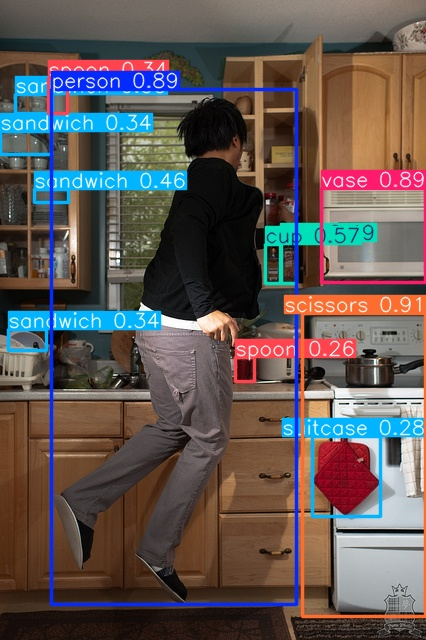

Displaying: 000000114065.jpg


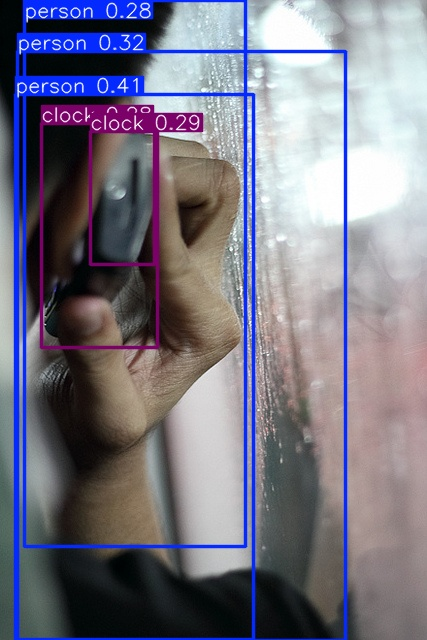

Displaying: 000000123285.jpg


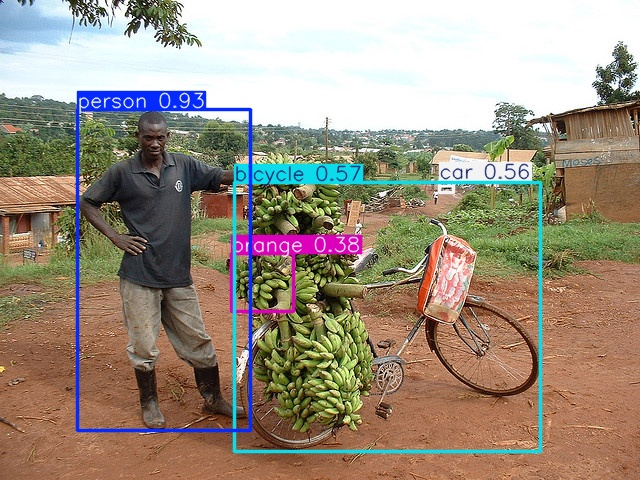

Displaying: 000000235666.jpg


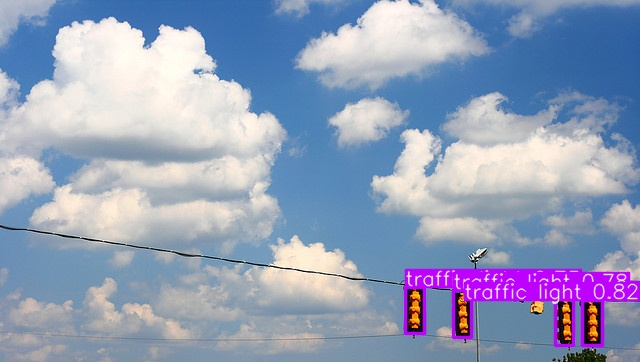

Displaying: 000000520495.jpg


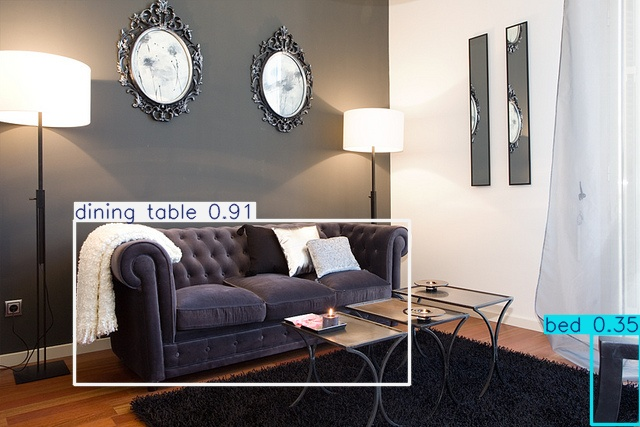

Displaying: 000000081349.jpg


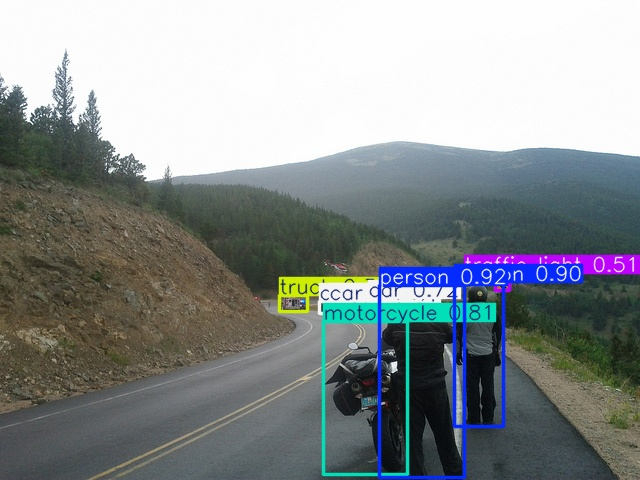

Displaying: 000000348153.jpg


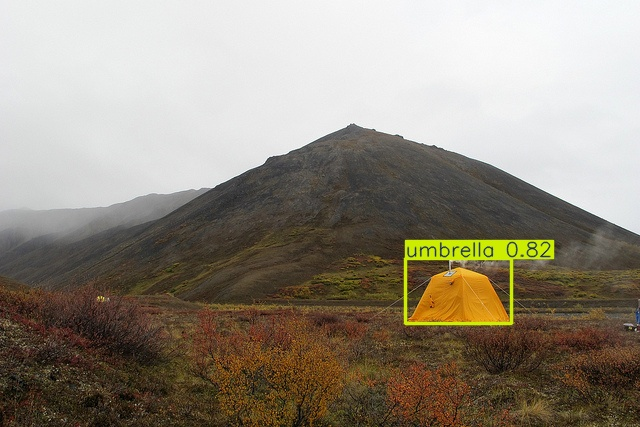

Displaying: 000000093239.jpg


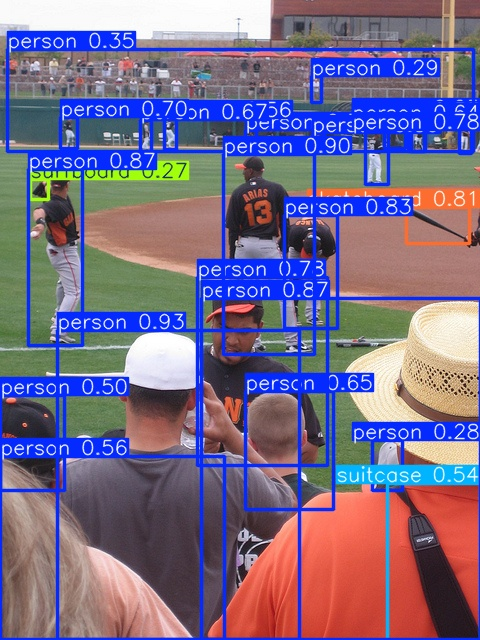

Displaying: 000000117613.jpg


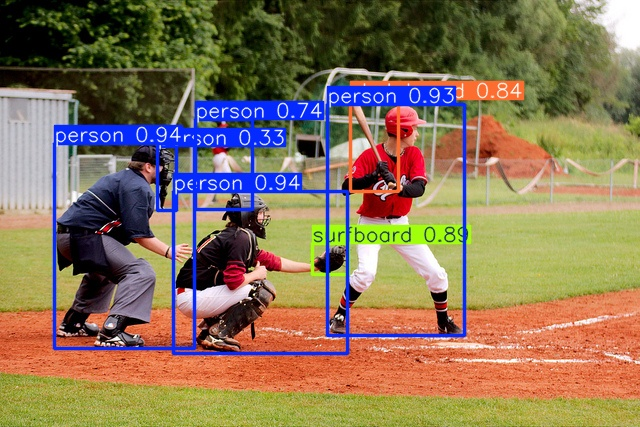

Displaying: 000000074994.jpg


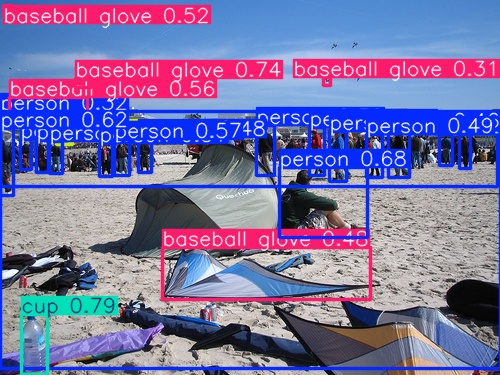

Displaying: 000000269765.jpg


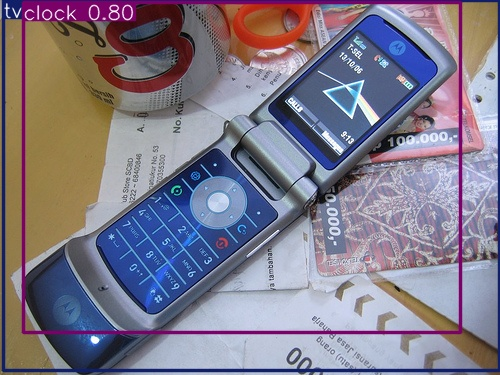

Displaying: 000000355443.jpg


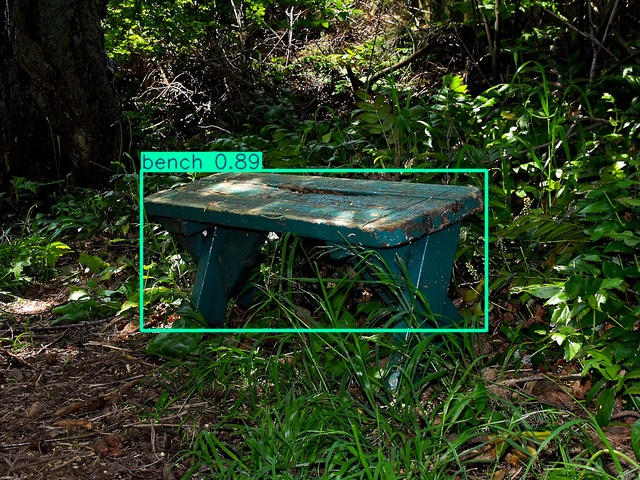

Displaying: 000000299989.jpg


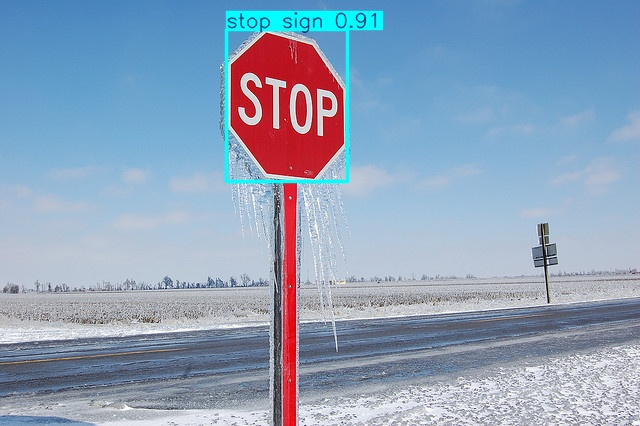

Displaying: 000000413670.jpg


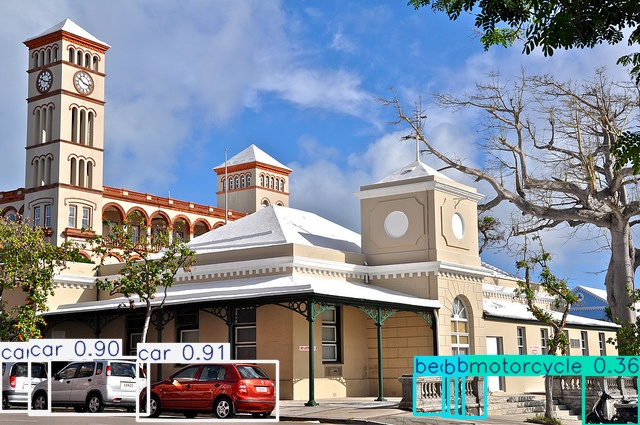

Displaying: 000000443791.jpg


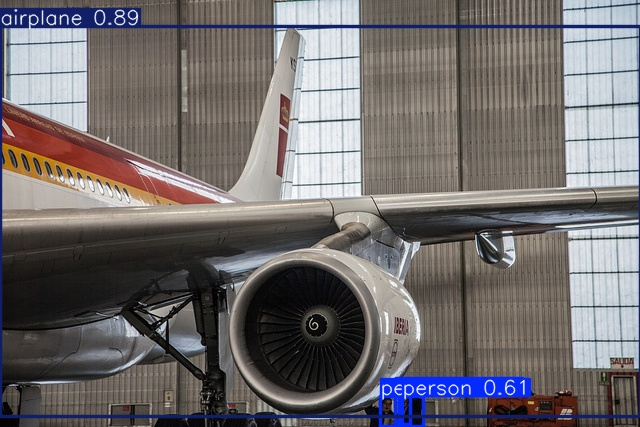

Displaying: 000000436639.jpg


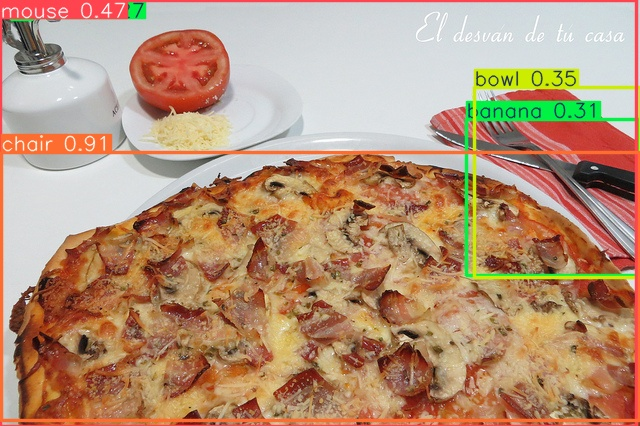

Displaying: 000000048889.jpg


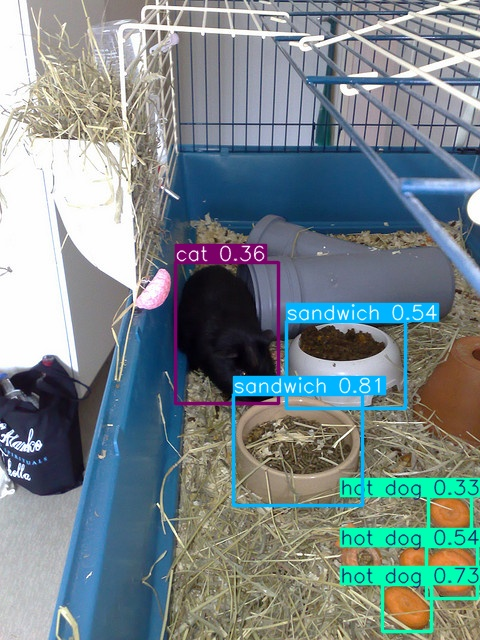

Displaying: 000000507924.jpg


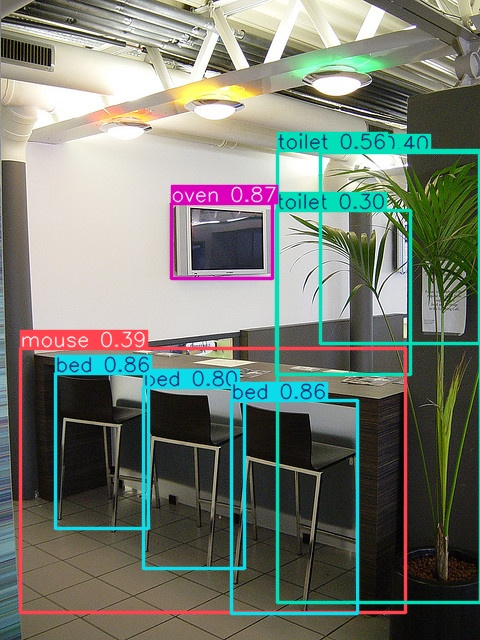

Displaying: 000000290206.jpg


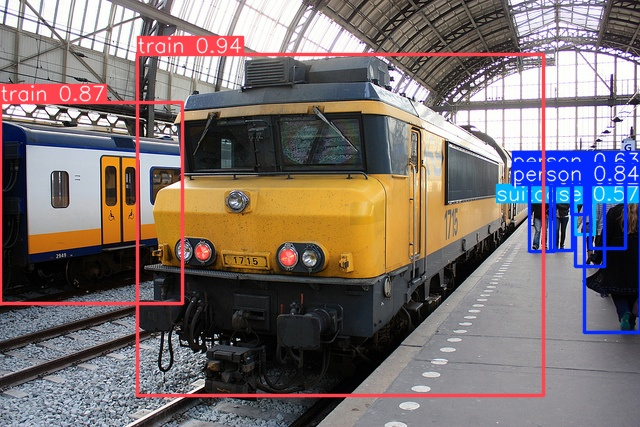

Displaying: 000000196829.jpg


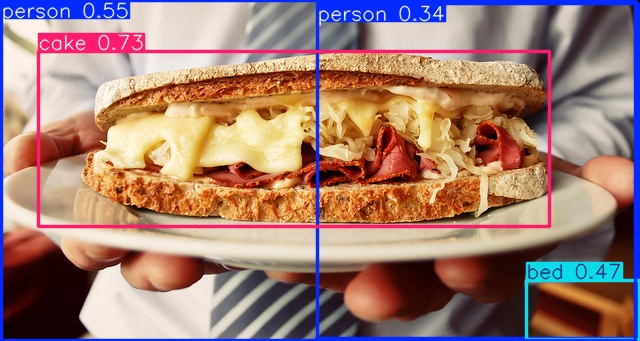

In [16]:

predict_dir = "/kaggle/working/runs/detect/train3"
predicted_images = [
    img for img in os.listdir(predict_dir) if img.endswith(('.png', '.jpg', '.jpeg'))
]
for img_name in predicted_images[:30]: 
    img_path = os.path.join(predict_dir, img_name)
    if os.path.exists(img_path):
        print(f"Displaying: {img_name}")
        display(Image(filename=img_path))
    else:
        print(f"File not found: {img_name}")
